# **Import packages**

In [ ]:
import numpy as np # handling multi-dimensional arrays and matrices
import pandas as pd # handling dataframes
from matplotlib import pyplot as plt # visualization for 2D and 3D plots
import seaborn as sns # based on matplotlib, for statistical graphics
from sklearn.preprocessing import LabelEncoder # function to encode categorical features
from sklearn.preprocessing import MinMaxScaler # function to scale features

# **Preprocessing**

In [ ]:
cc_data=pd.read_csv('/content/CC GENERAL.csv')
print(cc_data.shape) #print number of rows,columns in dataset
print(cc_data.columns)

(8950, 18)
Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')


In [ ]:
#show sample of dataset
cc_data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [ ]:
cc_data.info()
'''
we can observe from the output if there are null values
and alse we can see types of each column, memory usage of the dataset, and its shape
'''

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

'\nwe can observe from the output if there are null values\nand alse we can see types of each column, memory usage of the dataset, and its shape\n'

In [ ]:
# summation of null values at each column in the dataset
cc_data.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

**Handle missing values**

In [ ]:
# drop null values
cc_data.dropna(inplace=True)

cc_data.shape

(8636, 18)

**Check for Duplicates**

In [ ]:
# Check for duplicates
duplicates = cc_data[cc_data.duplicated()]
duplicates

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE


In [ ]:
# describe function Summarize Statistics for Numerical data to recognize the nature of our dataset, and to see if there are outliers
cc_data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,1601.224893,0.895035,1025.433874,604.901438,420.843533,994.175523,0.496000,0.205909,0.368820,0.137604,3.313918,15.033233,4522.091030,1784.478099,864.304943,0.159304,11.534391
std,2095.571300,0.207697,2167.107984,1684.307803,917.245182,2121.458303,0.401273,0.300054,0.398093,0.201791,6.912506,25.180468,3659.240379,2909.810090,2372.566350,0.296271,1.310984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000
25%,148.095189,0.909091,43.367500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.559237,169.163545,0.000000,12.000000
50%,916.855459,1.000000,375.405000,44.995000,94.785000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.675701,312.452292,0.000000,12.000000
75%,2105.195853,1.000000,1145.980000,599.100000,484.147500,1132.385490,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.142090,825.496463,0.166667,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [ ]:
# Summary Statistics for Categorical data
cc_data.describe(exclude=[np.number])

,CUST_ID
count,8636
unique,8636
top,C10001
freq,1


**Analyze numerican columns**

In [ ]:
# Select numerical columns
numerical_columns = cc_data.select_dtypes(include=['int64', 'float64']).columns
print(numerical_columns)

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'],
      dtype='object')


<Figure size 1200x800 with 0 Axes>

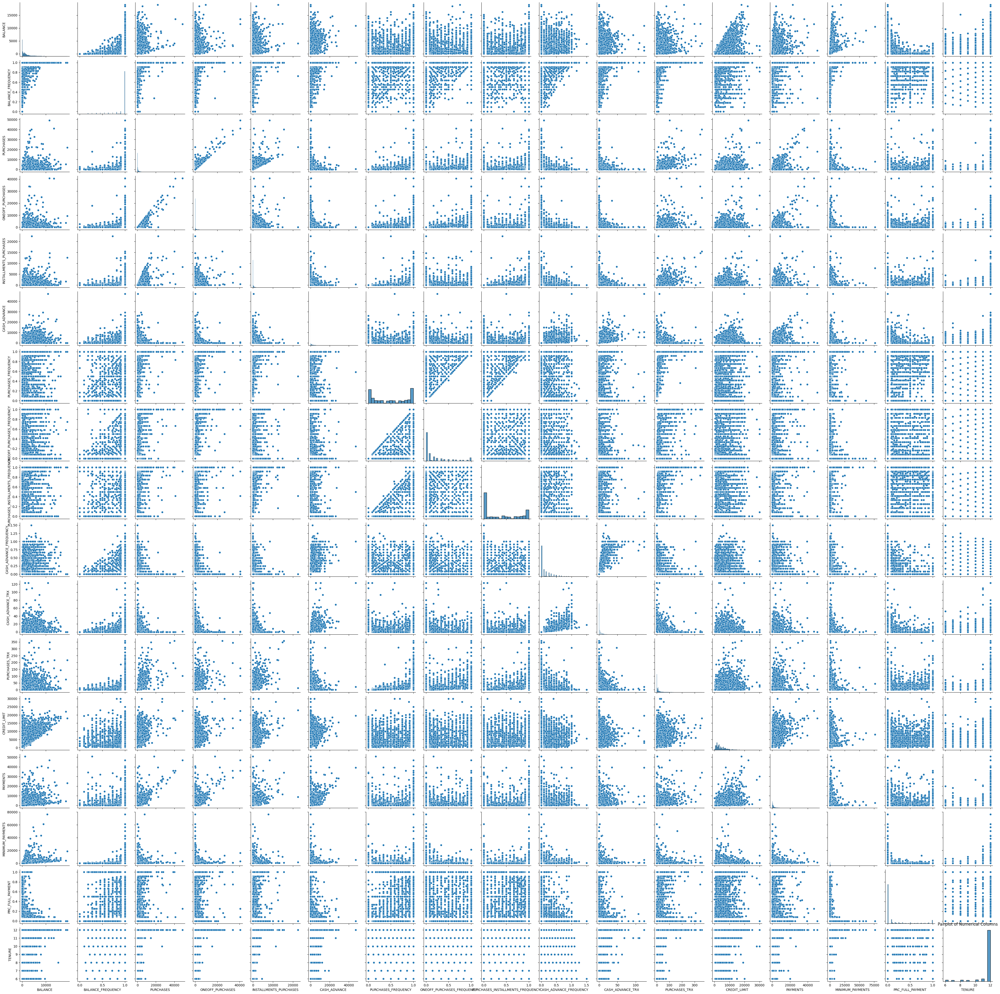

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select numerical columns
numerical_columns = cc_data.select_dtypes(include=['int64', 'float64'])

# Plot pairplot for numerical columns
plt.figure(figsize=(12, 8))
sns.pairplot(numerical_columns)
plt.title('Pairplot of Numerical Columns')
plt.show()

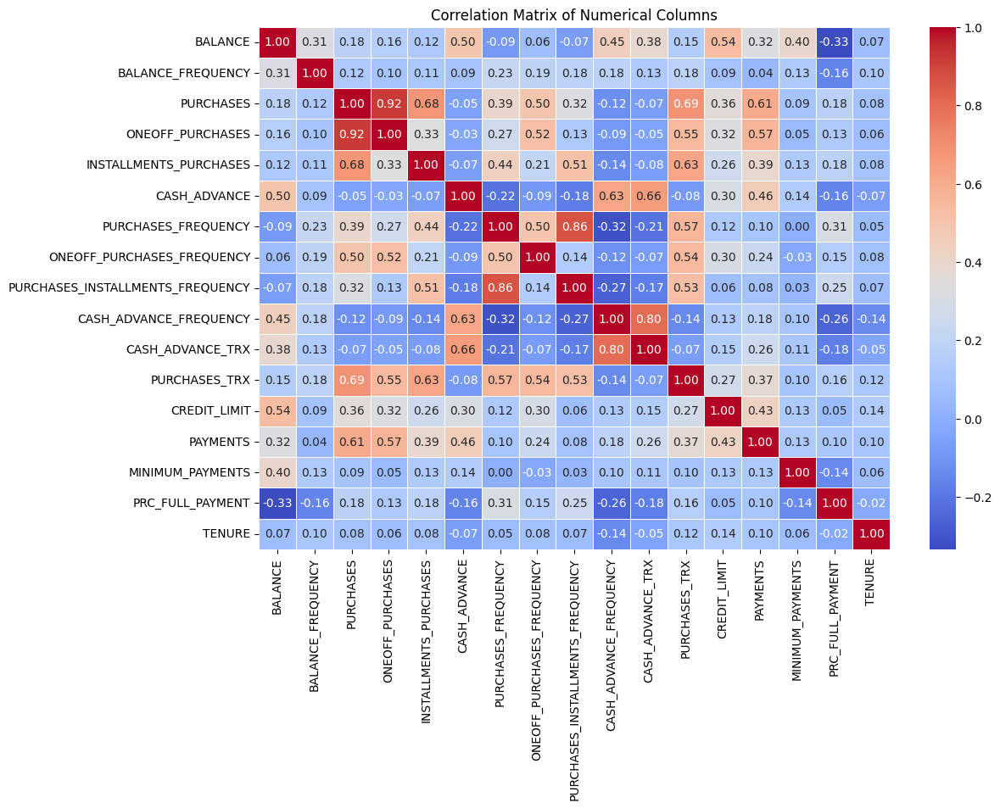

In [ ]:
# Calculate correlation matrix
corr_matrix = numerical_columns.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Columns')
plt.show()

In [ ]:
# Find the pair of variables with the highest correlation coefficient
highest_corr = corr_matrix.unstack().sort_values(ascending=False)
print(highest_corr[:5])  # Adjust the number to show more pairs if needed

BALANCE            BALANCE              1.0
BALANCE_FREQUENCY  BALANCE_FREQUENCY    1.0
PRC_FULL_PAYMENT   PRC_FULL_PAYMENT     1.0
MINIMUM_PAYMENTS   MINIMUM_PAYMENTS     1.0
PAYMENTS           PAYMENTS             1.0
dtype: float64


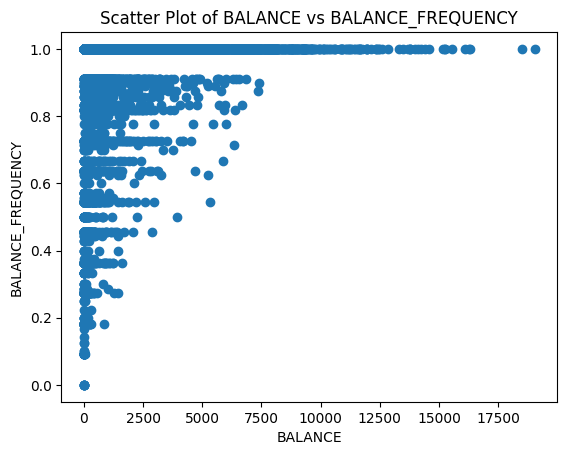

In [ ]:
# Scatter plot for two variables
plt.scatter(cc_data['BALANCE'], cc_data['BALANCE_FREQUENCY'])
plt.xlabel('BALANCE')
plt.ylabel('BALANCE_FREQUENCY')
plt.title('Scatter Plot of BALANCE vs BALANCE_FREQUENCY')
plt.show()

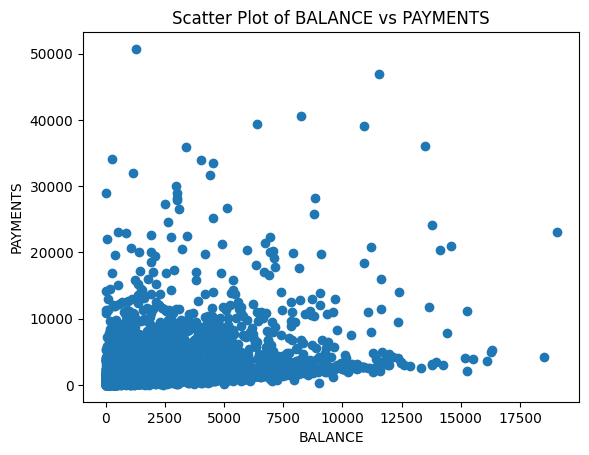

In [ ]:
# Scatter plot for two variables
plt.scatter(cc_data['BALANCE'], cc_data['PAYMENTS'])
plt.xlabel('BALANCE')
plt.ylabel('PAYMENTS')
plt.title('Scatter Plot of BALANCE vs PAYMENTS')
plt.show()

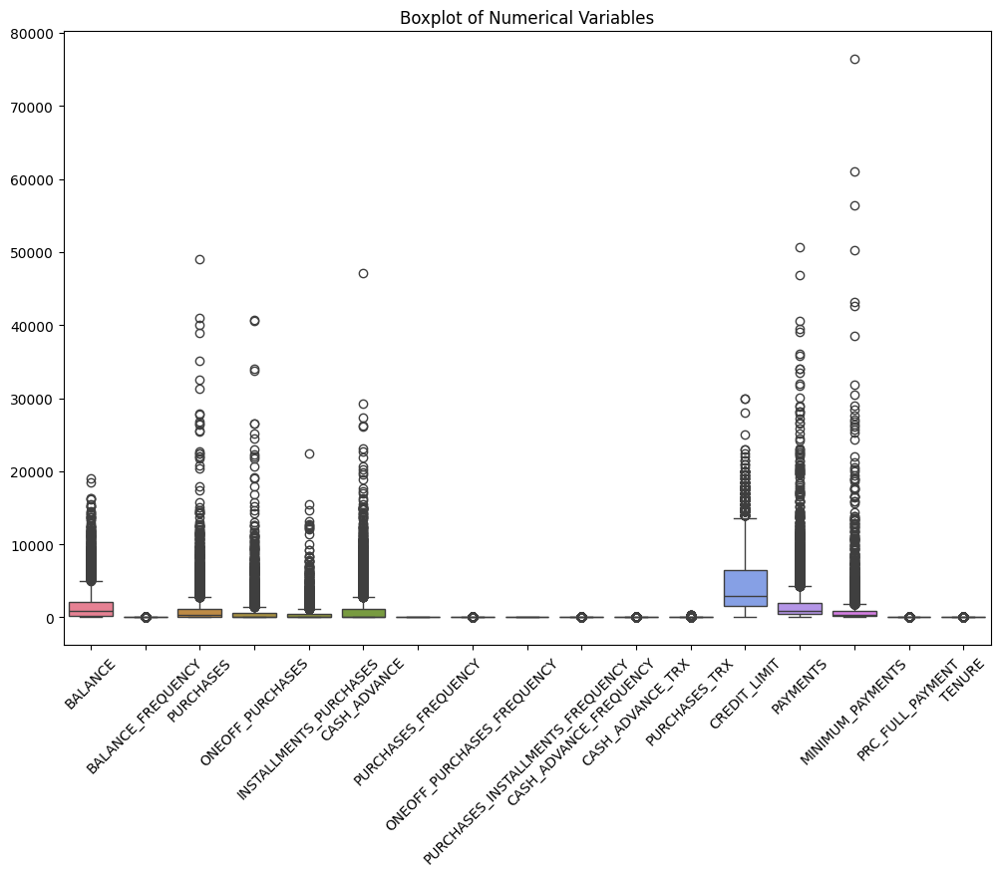

In [ ]:
# Boxplot for multiple numerical variables
plt.figure(figsize=(12, 8))
sns.boxplot(data=numerical_columns)
plt.title('Boxplot of Numerical Variables')
plt.xticks(rotation=45)
plt.show()

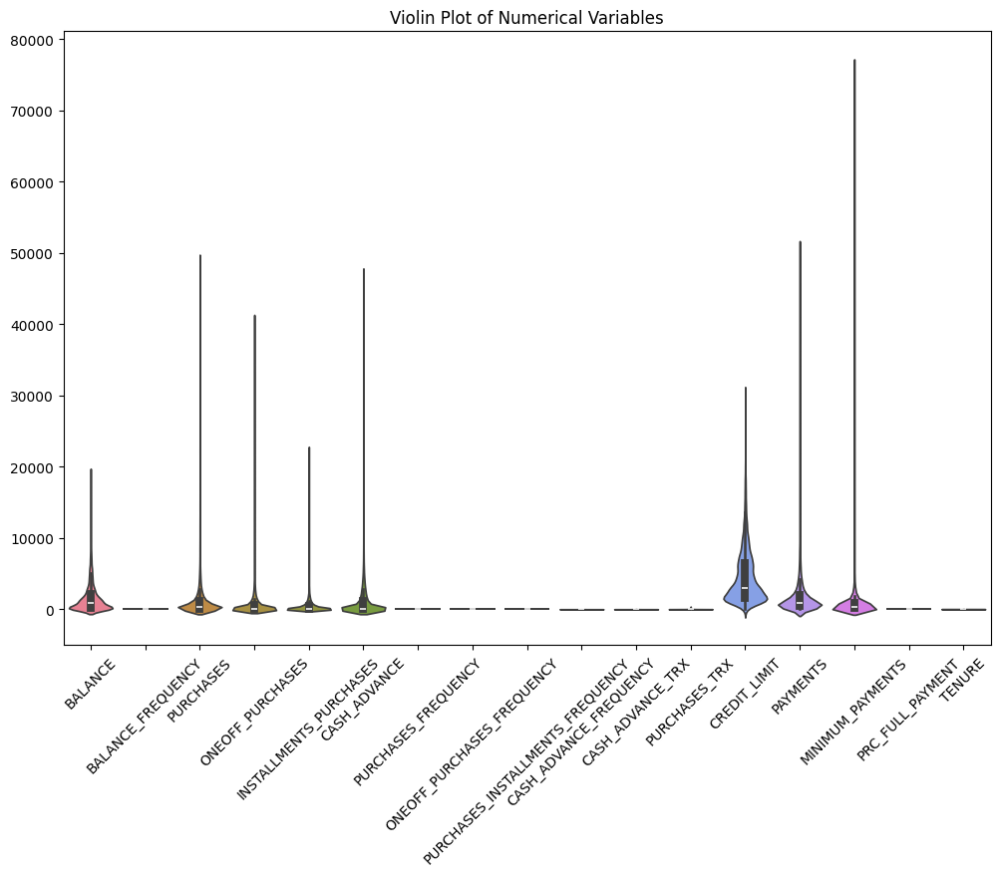

In [ ]:
# Violin plot for multiple numerical variables
plt.figure(figsize=(12, 8))
sns.violinplot(data=numerical_columns)
plt.title('Violin Plot of Numerical Variables')
plt.xticks(rotation=45)
plt.show()

**Analyze categorical columns**

In [ ]:
# Select categorical columns
categorical_columns = cc_data.select_dtypes(include=['object'])
categorical_columns
#we have only one categorical column that we're going to encode

,CUST_ID
0,C10001
1,C10002
2,C10003
4,C10005
5,C10006
...,...
8943,C19184
8945,C19186
8947,C19188
8948,C19189


**Encode categorical features**

In [ ]:
# use Label Encoding to encode "CUST_ID" column (categorical) to numerical
LE = LabelEncoder()
cc_data["CUST_ID"] = LE.fit_transform(cc_data["CUST_ID"])

cc_data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12
1,1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12
4,3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0,1,1200.0,678.334763,244.791237,0.000000,12
5,4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0,8,1800.0,1400.057770,2407.246035,0.000000,12


In [ ]:
# Calculate additional statistics after encoding
print("\nAdditional Statistics:")
print("Median:")
print(cc_data.median())
print("\nVariance:")
print(cc_data.var())
print("\nSkewness:")
print(cc_data.skew())
print("\nKurtosis:")
print(cc_data.kurtosis())


Additional Statistics:
Median:
CUST_ID                             4317.500000
BALANCE                              916.855459
BALANCE_FREQUENCY                      1.000000
PURCHASES                            375.405000
ONEOFF_PURCHASES                      44.995000
INSTALLMENTS_PURCHASES                94.785000
CASH_ADVANCE                           0.000000
PURCHASES_FREQUENCY                    0.500000
ONEOFF_PURCHASES_FREQUENCY             0.083333
PURCHASES_INSTALLMENTS_FREQUENCY       0.166667
CASH_ADVANCE_FREQUENCY                 0.000000
CASH_ADVANCE_TRX                       0.000000
PURCHASES_TRX                          7.000000
CREDIT_LIMIT                        3000.000000
PAYMENTS                             896.675701
MINIMUM_PAYMENTS                     312.452292
PRC_FULL_PAYMENT                       0.000000
TENURE                                12.000000
dtype: float64

Variance:
CUST_ID                             6.215761e+06
BALANCE                      

**Observe outliers**

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


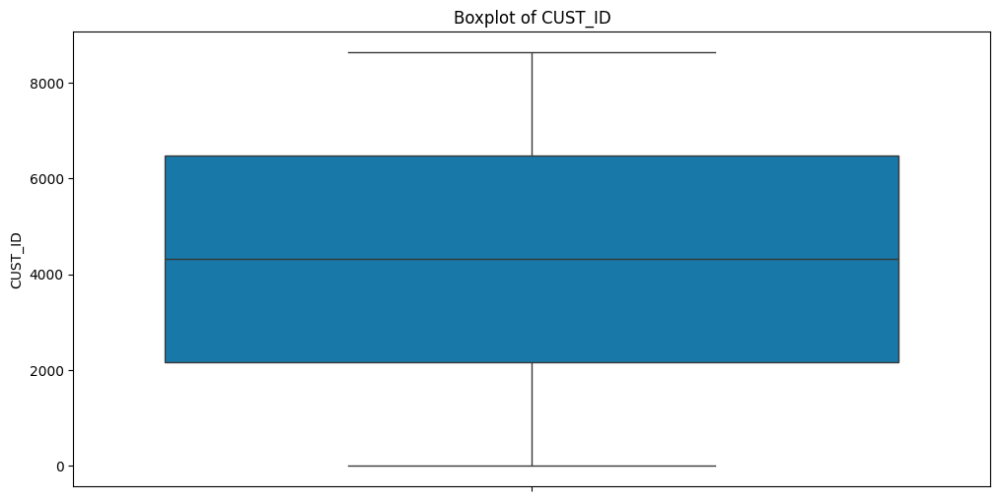

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


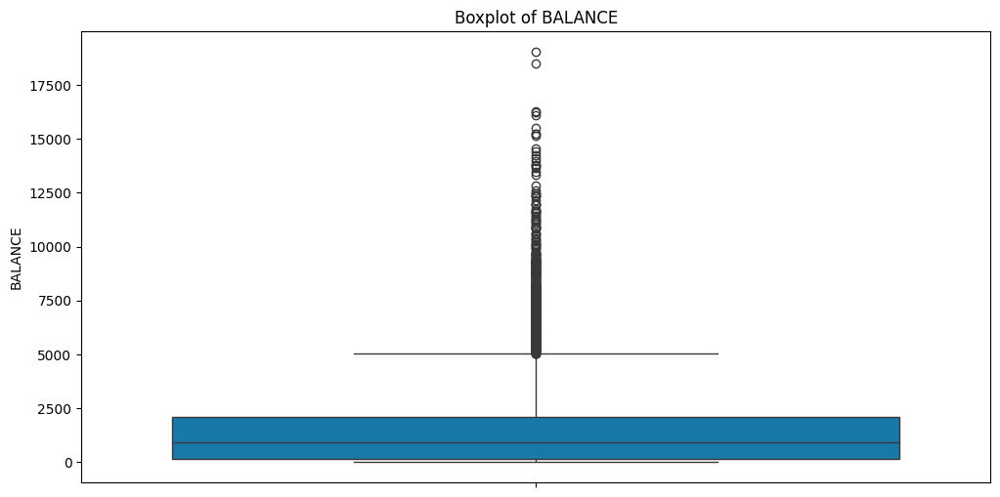

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


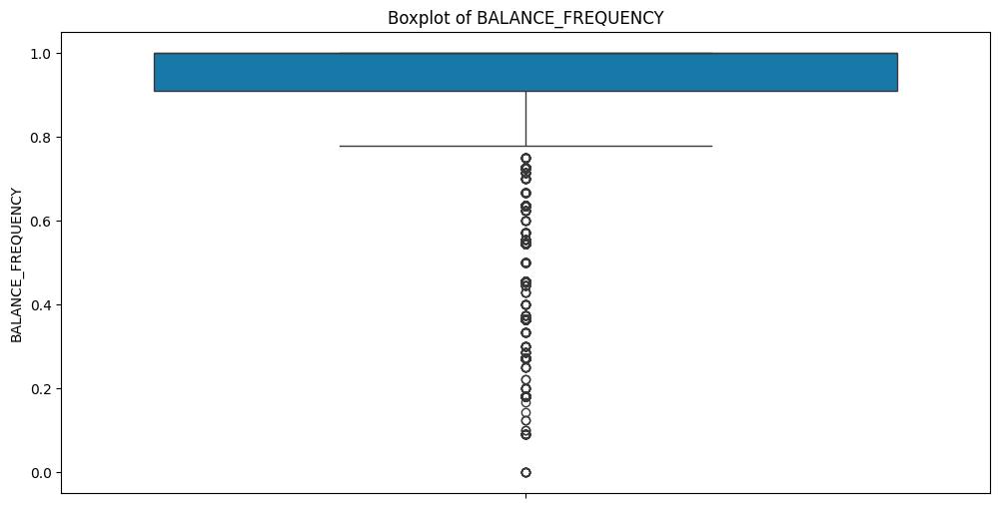

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


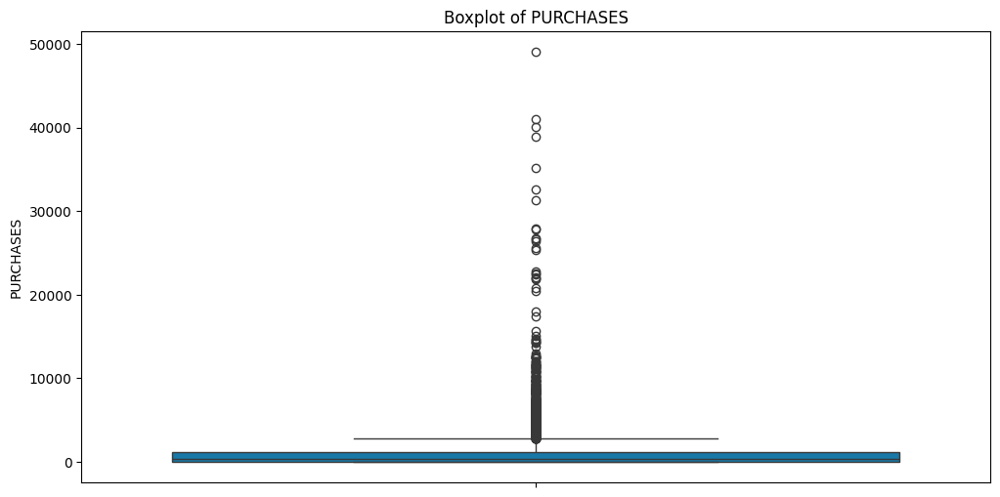

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


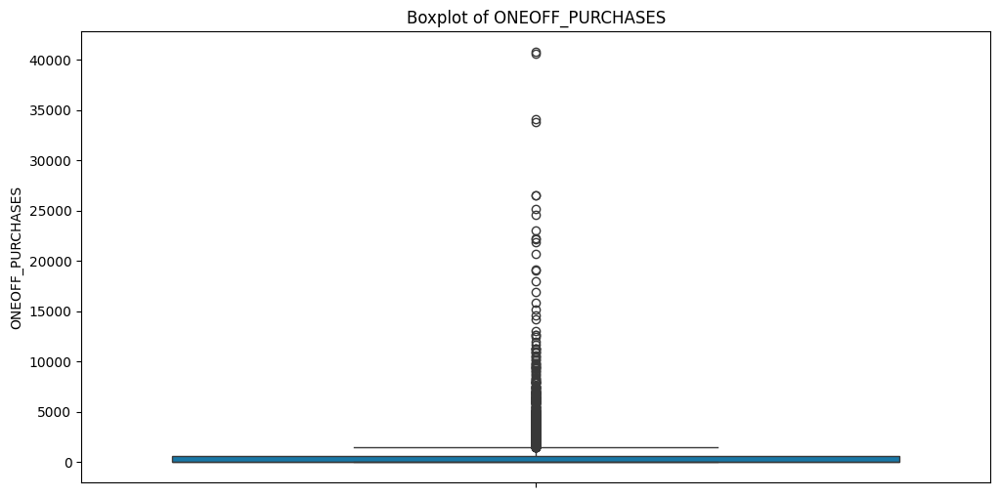

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


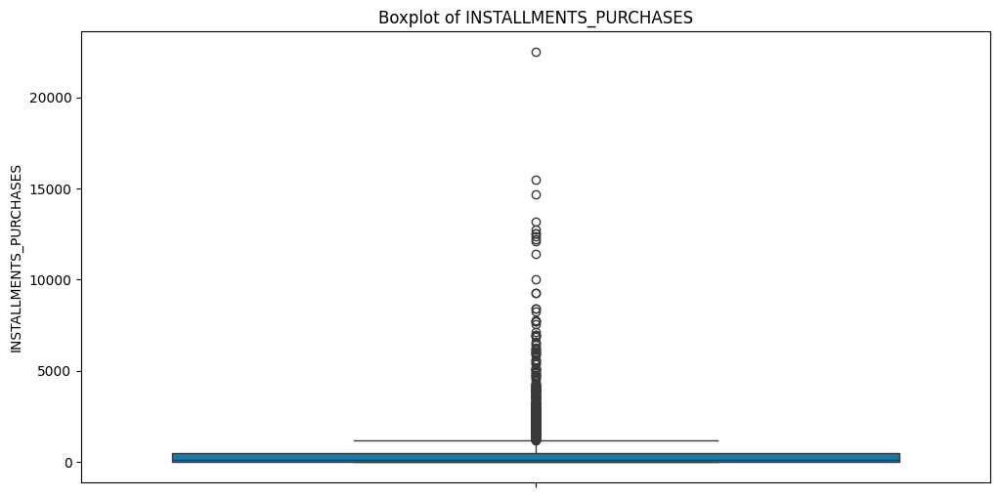

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


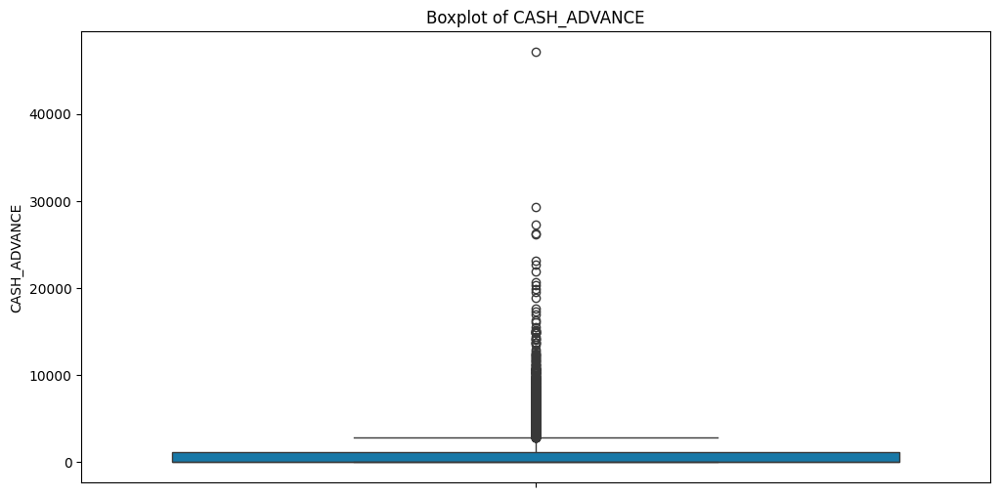

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


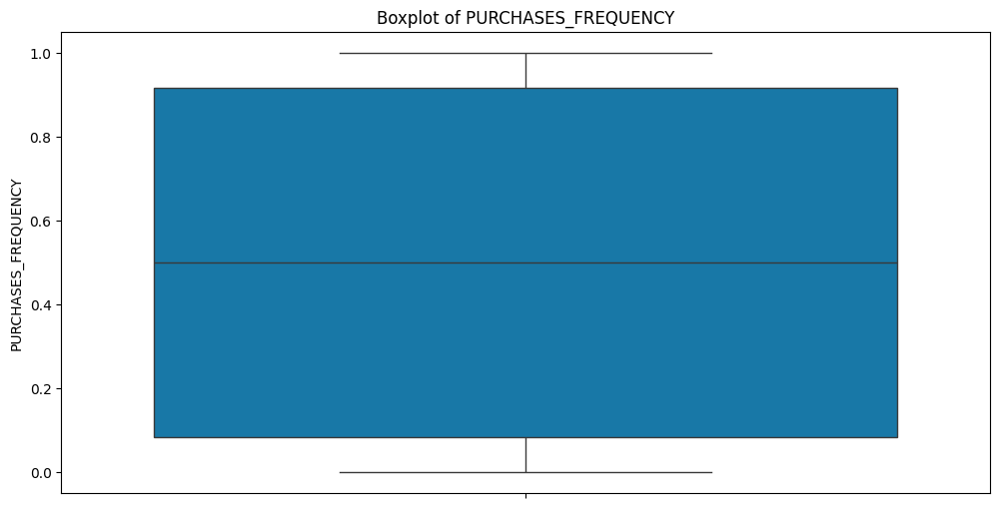

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


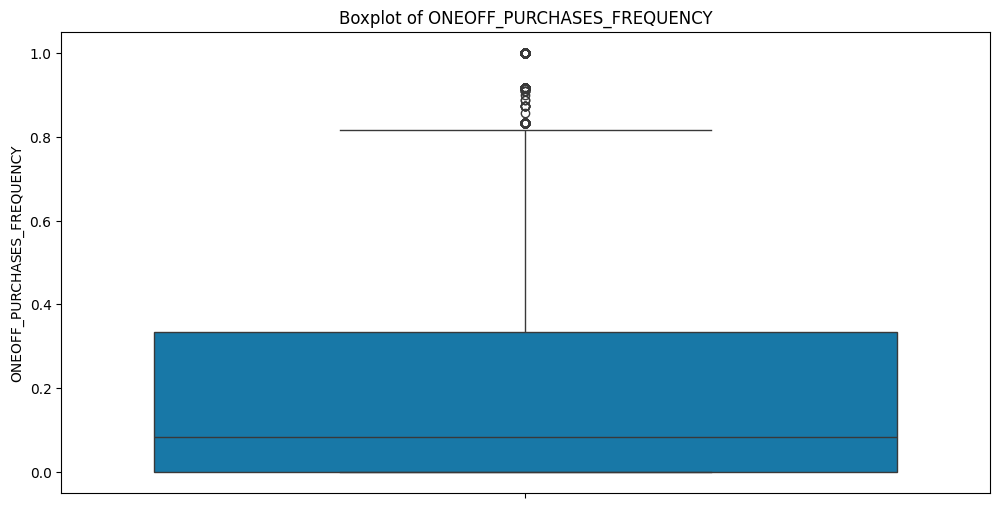

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


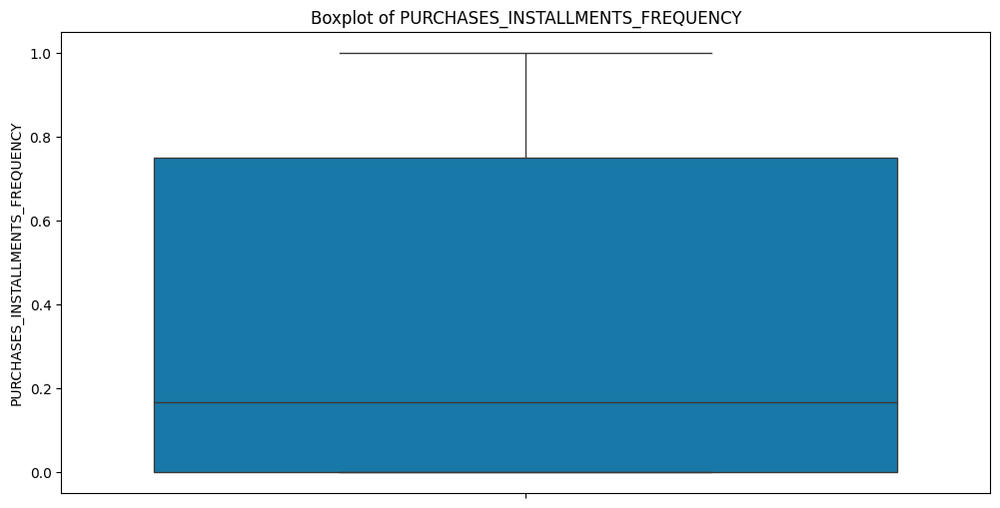

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


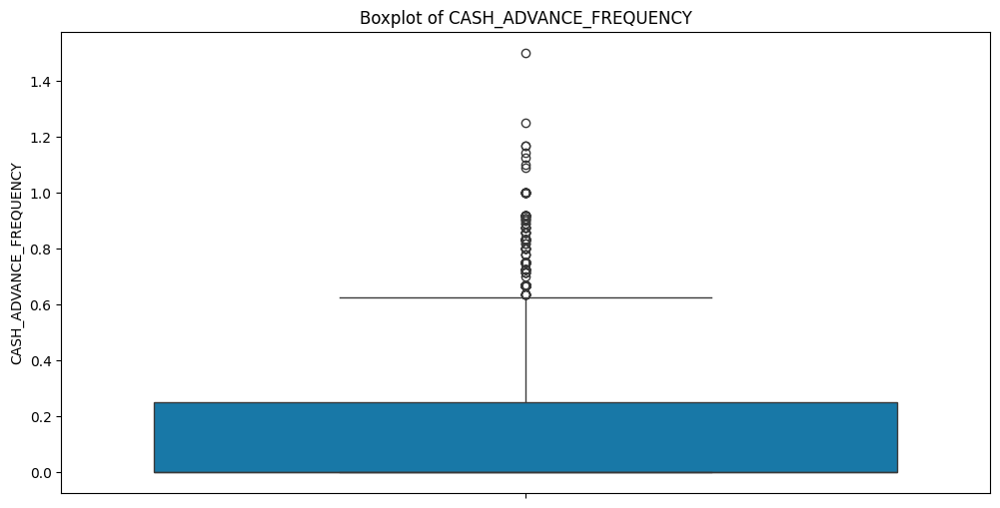

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


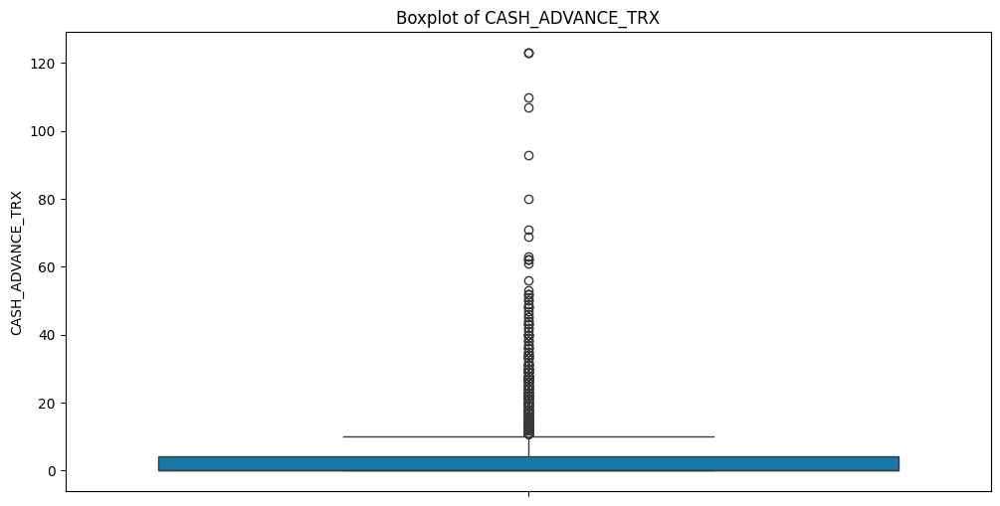

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


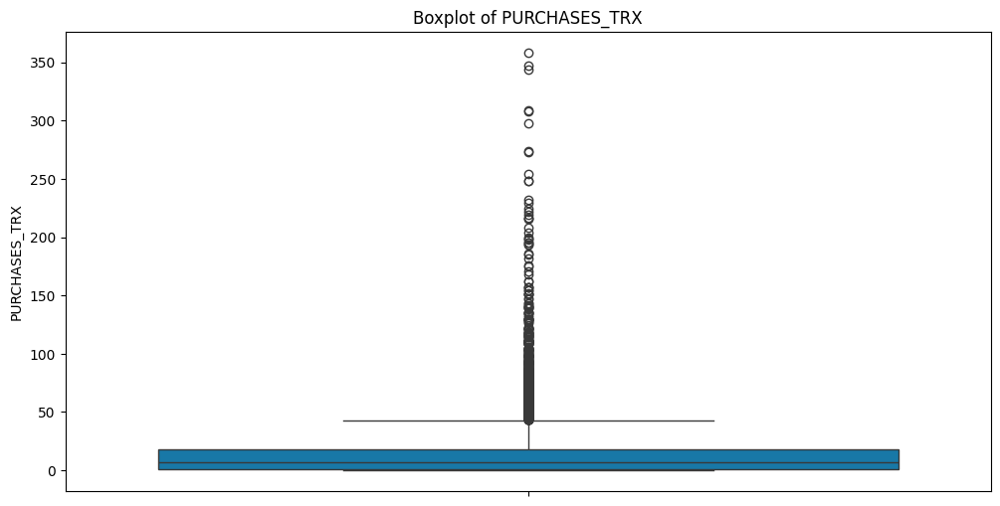

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


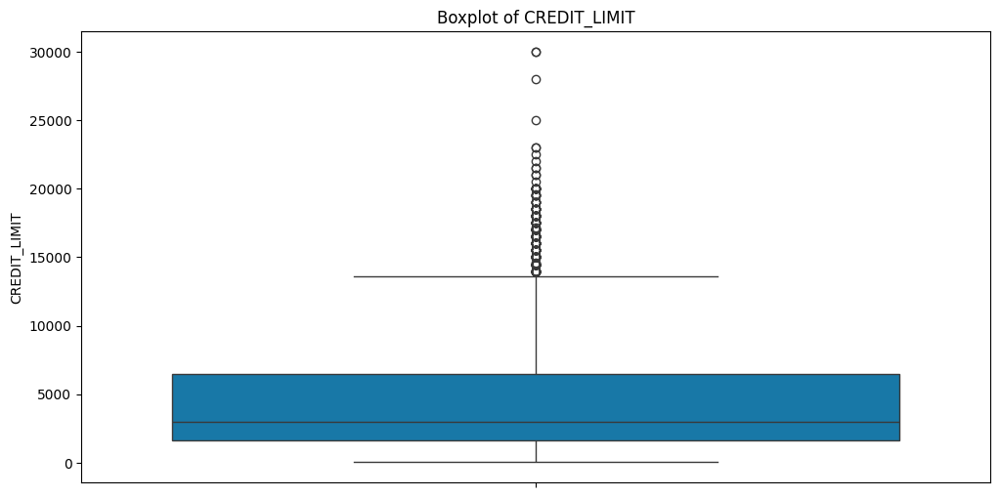

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


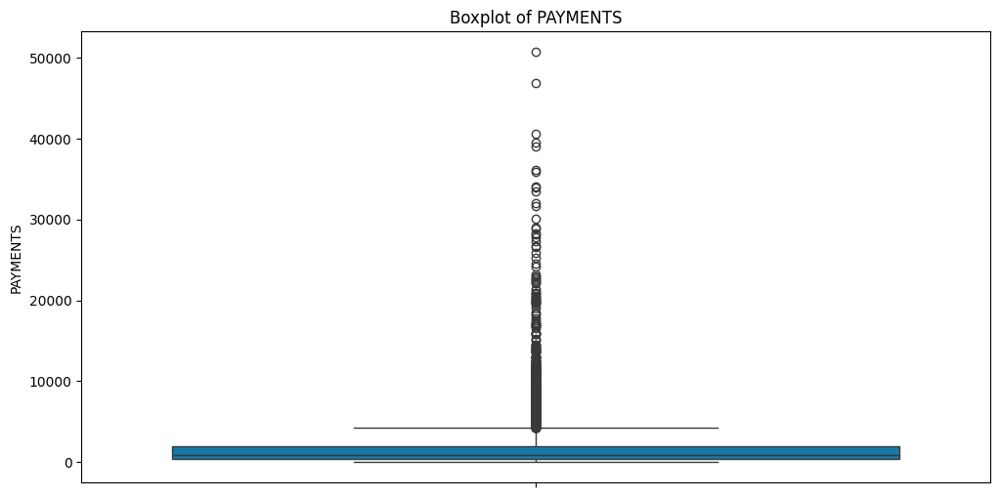

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


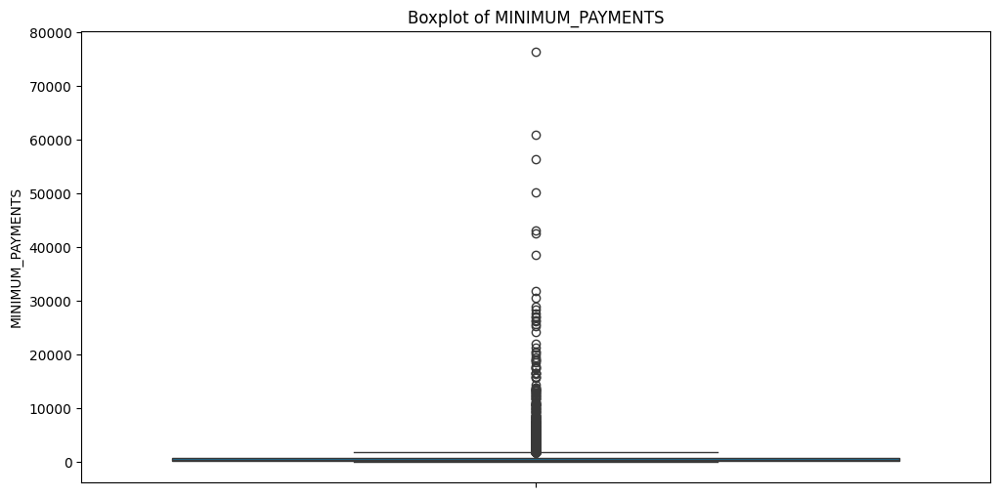

<ipython-input-21-a671bd92d9ce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')


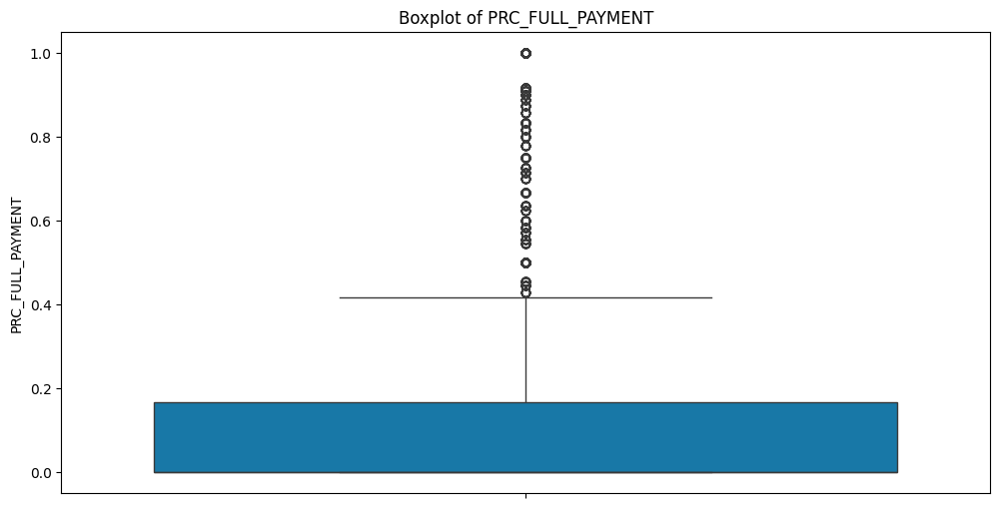

"We observed the outliers, but we didn't define them precisely"

In [ ]:
# generate a series of boxplots, one for each column in the dataset to visualize potential outliers

for i in range(len(cc_data.columns)-1):
    plt.figure(figsize=(12, 6))
    sns.boxplot(y=cc_data.columns[i], data=cc_data, palette='winter')
    plt.title('Boxplot of ' + cc_data.columns[i])
    plt.show()

'''We observed the outliers, but we didn't define them precisely'''

**Handling outliers with IQR method**

In [ ]:
# we want to identify outliers with accurate numbers instead of depending on our observation
'''outliers are identified using IQR by checking which data points
fall below the lower bound or above the upper bound'''

# Define the remove_outliers function
def remove_outliers(df, columns, threshold):
    cleaned_data = df.copy()
    for column in columns:
        Q1 = cleaned_data[column].quantile(0.25)
        Q3 = cleaned_data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - threshold * IQR
        upper_bound = Q3 + threshold * IQR
        cleaned_data = cleaned_data[(cleaned_data[column] >= lower_bound) & (cleaned_data[column] <= upper_bound)]
    return cleaned_data

In [ ]:
# Define the iterative_outlier_removal function
def iterative_outlier_removal(df, columns, threshold=1.5, max_iterations=5):
    outliers_before_removal = {}
    outliers_after_removal = {}
    cleaned_data = df.copy()  # Copy of the original dataset
    for i in range(max_iterations):
        outliers_before_removal[i] = {}
        for column in columns:
            Q1 = cleaned_data[column].quantile(0.25)
            Q3 = cleaned_data[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - threshold * IQR
            upper_bound = Q3 + threshold * IQR
            outliers = cleaned_data[(cleaned_data[column] < lower_bound) | (cleaned_data[column] > upper_bound)]
            outliers_before_removal[i][column] = outliers
        cleaned_data = remove_outliers(cleaned_data, columns, threshold)
        outliers_after_removal[i] = {}
        for column in columns:
            Q1 = cleaned_data[column].quantile(0.25)
            Q3 = cleaned_data[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - threshold * IQR
            upper_bound = Q3 + threshold * IQR
            outliers = cleaned_data[(cleaned_data[column] < lower_bound) | (cleaned_data[column] > upper_bound)]
            outliers_after_removal[i][column] = outliers
        # Check if the dataset size has stabilized (no change from previous iteration)
        if i > 0 and len(cleaned_data) == len(prev_cleaned_data):
            break
        prev_cleaned_data = cleaned_data.copy()  # Track the cleaned dataset from the previous iteration
    return cleaned_data, outliers_before_removal, outliers_after_removal

# Define the columns to remove outliers from
columns = cc_data.columns

# Apply iterative outlier removal
cleaned_data, outliers_before, outliers_after = iterative_outlier_removal(cc_data, columns, threshold=4, max_iterations=5)

In [ ]:
# Display outliers before and after removal
for iteration, outliers_dict in outliers_before.items():
    print(f"Iteration {iteration + 1}: Outliers before removal")
    for column, outliers in outliers_dict.items():
        print(f"Column '{column}' has {len(outliers)} outliers before removal.")
    print("---------------------------------------------")

for iteration, outliers_dict in outliers_after.items():
    print(f"Iteration {iteration + 1}: Outliers after removal")
    for column, outliers in outliers_dict.items():
        print(f"Column '{column}' has {len(outliers)} outliers after removal.")
    print("---------------------------------------------")

Iteration 1: Outliers before removal
Column 'CUST_ID' has 0 outliers before removal.
Column 'BALANCE' has 68 outliers before removal.
Column 'BALANCE_FREQUENCY' has 744 outliers before removal.
Column 'PURCHASES' has 232 outliers before removal.
Column 'ONEOFF_PURCHASES' has 371 outliers before removal.
Column 'INSTALLMENTS_PURCHASES' has 236 outliers before removal.
Column 'CASH_ADVANCE' has 302 outliers before removal.
Column 'PURCHASES_FREQUENCY' has 0 outliers before removal.
Column 'ONEOFF_PURCHASES_FREQUENCY' has 0 outliers before removal.
Column 'PURCHASES_INSTALLMENTS_FREQUENCY' has 0 outliers before removal.
Column 'CASH_ADVANCE_FREQUENCY' has 1 outliers before removal.
Column 'CASH_ADVANCE_TRX' has 239 outliers before removal.
Column 'PURCHASES_TRX' has 196 outliers before removal.
Column 'CREDIT_LIMIT' has 3 outliers before removal.
Column 'PAYMENTS' has 266 outliers before removal.
Column 'MINIMUM_PAYMENTS' has 294 outliers before removal.
Column 'PRC_FULL_PAYMENT' has 642 

In [ ]:
cleaned_data.shape

(3057, 18)

In [ ]:
# Accessing outliers for columns and storing lower and upper bounds
lower_upper_bounds = {}  # Dictionary to store lower and upper bounds for columns
for column in cc_data:
    lower_upper_bounds[column] = (cc_data[column].quantile(0.25) - 1.5 * (cc_data[column].quantile(0.75) - cc_data[column].quantile(0.25)),
                                  cc_data[column].quantile(0.75) + 1.5 * (cc_data[column].quantile(0.75) - cc_data[column].quantile(0.25)))

In [ ]:
# Printing lower and upper bounds for 'PAYMENTS'
print("Lower bound for PAYMENTS:", lower_upper_bounds['PAYMENTS'][0])
print("Upper bound for PAYMENTS:", lower_upper_bounds['PAYMENTS'][1])

Lower bound for PAYMENTS: -1880.315042625
Upper bound for PAYMENTS: 4250.016370375


In [ ]:
# Printing outliers found for 'PAYMENTS' before removal
print("\nOutliers found for 'PAYMENTS' before removal:")
for iteration, outliers_dict in outliers_before.items():
    print(f"Iteration {iteration + 1}: Outliers before removal")
    for column, outliers in outliers_dict.items():
        if column == 'PAYMENTS':  # Check if the column is 'PAYMENTS'
            print(outliers)  # Print outliers for 'PAYMENTS'
    print("---------------------------------------------")


Outliers found for 'PAYMENTS' before removal:
Iteration 1: Outliers before removal
      CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
23         22  3800.151377           0.818182    4248.35           3454.56   
34         33  3517.101616           0.727273     547.28              0.00   
39         38  1411.602230           0.454545     963.24            963.24   
50         47  4931.331857           1.000000     901.42            646.07   
71         64  2990.422186           0.909091    4523.27           1664.09   
...       ...          ...                ...        ...               ...   
8052     7788  3342.878215           0.818182    1368.70           1300.00   
8237     7963  2144.040539           1.000000       0.00              0.00   
8315     8039  2648.244646           1.000000       0.00              0.00   
8737     8436  2533.618119           0.909091    5633.83           2985.92   
8857     8548  2330.222764           1.000000    1320.00  

In [ ]:
# Printing outliers found for 'PAYMENTS' after removal
print("\nOutliers found for 'PAYMENTS' after removal:")
for iteration, outliers_dict in outliers_after.items():
    print(f"Iteration {iteration + 1}: Outliers after removal")
    for column, outliers in outliers_dict.items():
        if column == 'PAYMENTS':  # Check if the column is 'PAYMENTS'
            print(outliers)  # Print outliers for 'PAYMENTS'
    print("---------------------------------------------")


Outliers found for 'PAYMENTS' after removal:
Iteration 1: Outliers after removal
      CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
339       308  3355.631092           1.000000     242.88              0.00   
424       387  1692.755487           0.909091     570.16              0.00   
739       698  5603.045332           1.000000       0.00              0.00   
870       815  1444.365154           0.727273     780.14             69.90   
993       919  2845.160430           0.727273     735.09            652.94   
2012     1911   498.761608           1.000000    1159.15            119.00   
2740     2624   810.523480           0.727273     985.33            856.09   
2859     2743   409.194212           0.545455    1213.23           1213.23   
2979     2860  3586.660250           1.000000     342.00            177.00   
3001     2882   198.377577           0.636364       0.00              0.00   
3420     3294  3197.652201           1.000000       0.00    

**Scaling the numerical features**

In [ ]:
# initialize the MinMaxScaler
MS = MinMaxScaler()
# fit the scaler on the features and transform them
scaled_features = MS.fit_transform(cleaned_data)
scaled_features

# create a new DataFrame with the scaled features
scaled_data = pd.DataFrame(scaled_features, columns=cleaned_data.columns)

In [ ]:
# display the updated DataFrame with scaled features
scaled_data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.000000,0.283609,0.0,0.246452,0.406797,0.000000,0.0,1.000000,1.000000,0.000000,0.0,0.0,0.184615,0.411765,0.136972,0.206034,0.0,0.0
1,0.000118,0.092743,0.0,0.005100,0.008418,0.000000,0.0,0.083333,0.083333,0.000000,0.0,0.0,0.015385,0.058824,0.149657,0.079759,0.0,0.0
2,0.000237,0.205630,0.0,0.424990,0.000000,0.920303,0.0,0.666667,0.000000,0.583333,0.0,0.0,0.123077,0.092437,0.312365,0.793663,0.0,0.0
3,0.000473,0.207203,0.0,0.139041,0.000000,0.301089,0.0,1.000000,0.000000,1.000000,0.0,0.0,0.184615,0.120448,0.149822,0.174588,0.0,0.0
4,0.000592,0.115183,0.0,0.274605,0.348037,0.138051,0.0,0.333333,0.083333,0.250000,0.0,0.0,0.076923,0.383754,0.151899,0.101935,0.0,0.0


**More visualization after encoding and scaling**

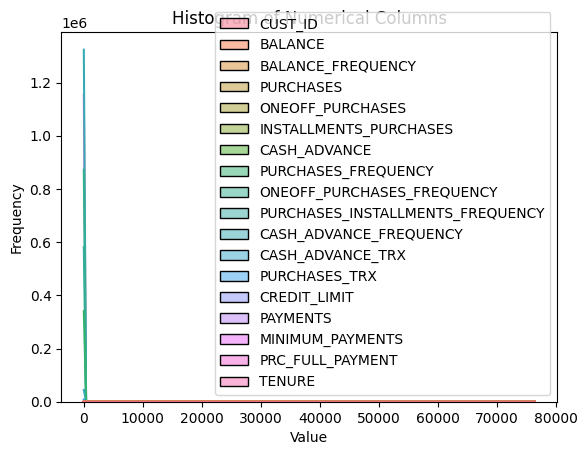

In [ ]:
import seaborn as sns

# Histogram of numerical columns
sns.histplot(cc_data, kde=True)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of Numerical Columns')
plt.show()

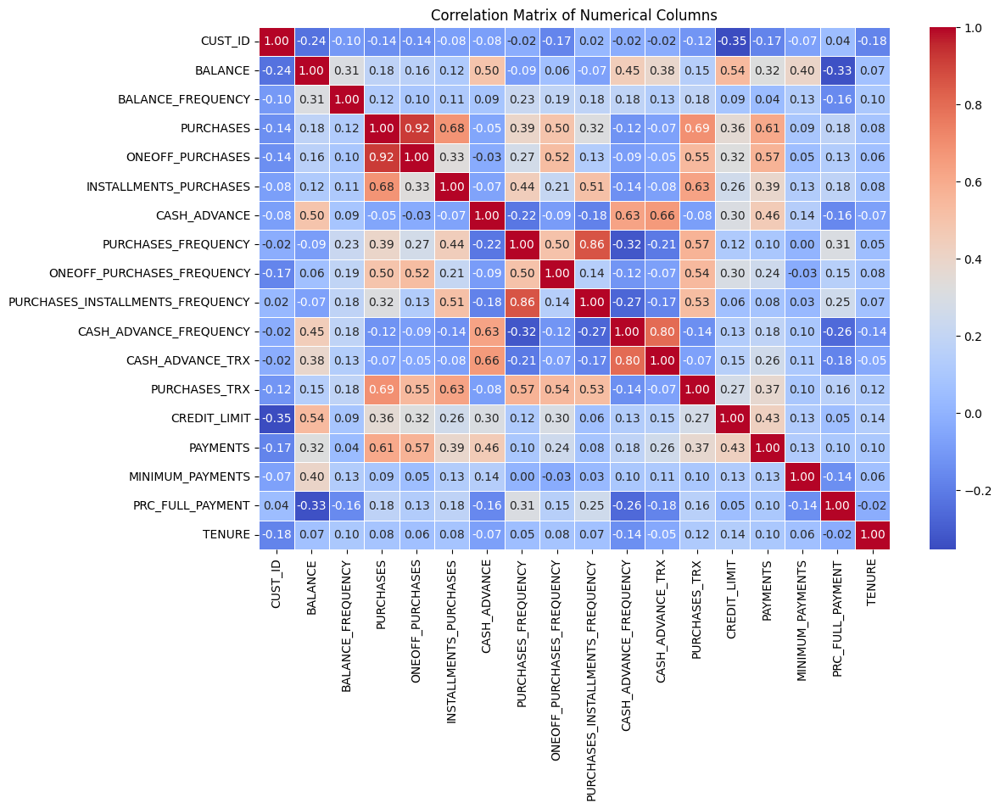

In [ ]:
# Calculate correlation matrix for whole data after encoding and scaling
corr_matrix = cc_data.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Columns')
plt.show()

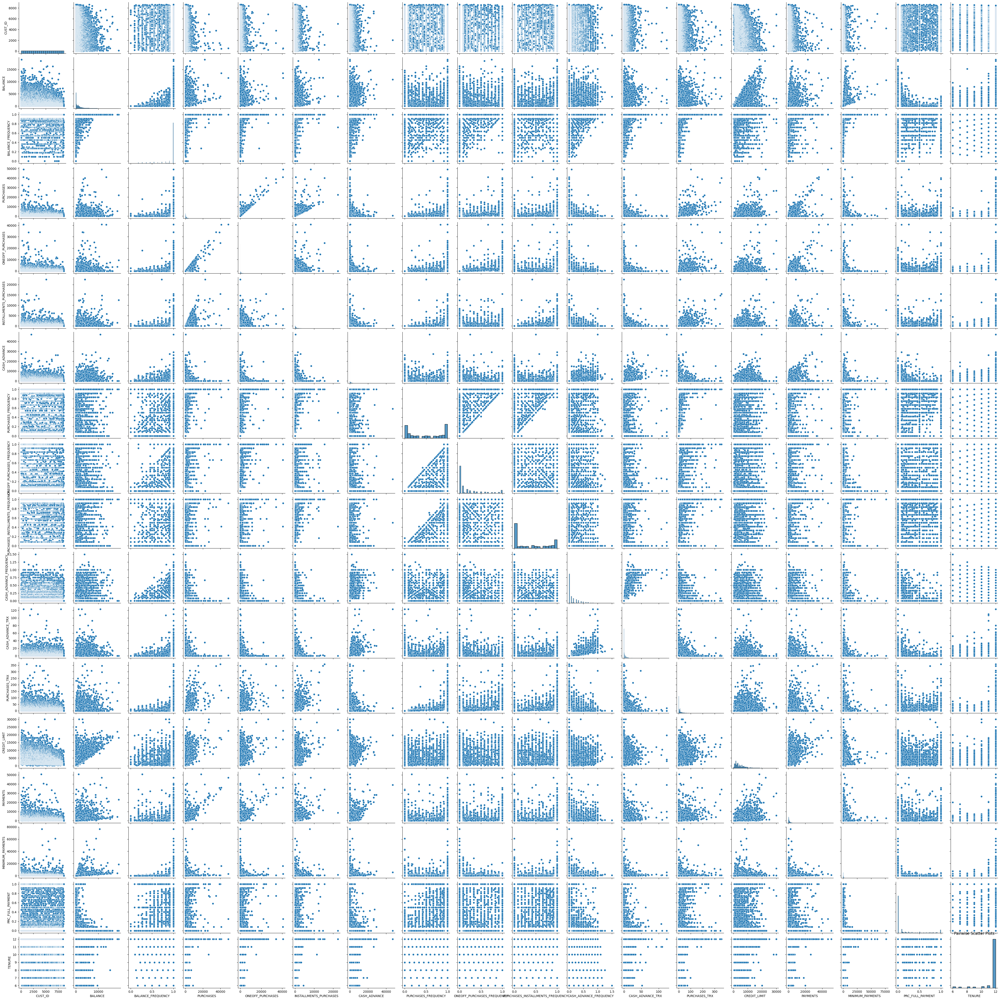

In [ ]:
# Pairwise scatter plots
sns.pairplot(cc_data)
plt.title('Pairwise Scatter Plots')
plt.show()

# **K-medoids**

In [ ]:
pip install scikit-learn-extra

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
# Compute silhouette score for different values of k to get the optimal number of k
for n_clusters in range(2, 9):  # Trying k from 2 to 9
    kmedoids = KMedoids(n_clusters=n_clusters, random_state=0)
    labels = kmedoids.fit_predict(scaled_data)
    silhouette_avg = silhouette_score(scaled_data, labels)
    print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg}")

For n_clusters = 2, the average silhouette_score is : 0.32297533940101164
For n_clusters = 3, the average silhouette_score is : 0.17173806475782621
For n_clusters = 4, the average silhouette_score is : 0.2046578100490175
For n_clusters = 5, the average silhouette_score is : 0.15597909497594725
For n_clusters = 6, the average silhouette_score is : 0.13979017809426852
For n_clusters = 7, the average silhouette_score is : 0.13600439280738721
For n_clusters = 8, the average silhouette_score is : 0.13003006663796307


In [ ]:
data=np.array(scaled_data)
k=2
kmedoids = KMedoids(n_clusters=k).fit(data)

labels= kmedoids.labels_
clusters=kmedoids.cluster_centers_

print('clusters',clusters)

for i in range(k):
  for j in range(len(data)):
    if (labels[j]==i):
      y=data[j]
      print('cluster ',i,':',y)


Görüntülenen çıkış son 5000 satıra kısaltıldı.
cluster  1 : [0.03028869 0.27514531 0.         0.         0.         0.
 0.11089862 0.         0.         0.         0.09090869 0.1
 0.         0.15966387 0.19325319 0.2000655  0.         0.        ]
cluster  1 : [0.03064363 0.62208542 0.         0.         0.         0.
 0.10025496 0.         0.         0.         0.18181848 0.15
 0.         0.32773109 0.30400319 0.66549857 0.         0.        ]
cluster  1 : [0.03088027 0.65861937 0.         0.14806515 0.21014611 0.0449356
 0.49203972 0.416667   0.25       0.166667   0.18181848 0.3
 0.15384615 0.32773109 0.3384121  0.68989168 0.         0.        ]
cluster  1 : [0.03099858 0.40997494 0.         0.56706617 0.93600543 0.
 0.         0.166667   0.166667   0.         0.         0.
 0.03076923 0.27170868 0.18972386 0.25018198 0.         0.        ]
cluster  1 : [0.0311169  0.45395821 0.         0.         0.         0.
 0.06819983 0.         0.         0.         0.63636304 0.45
 0.         0

# **hierarchical clustering**

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

np.set_printoptions(threshold=np.inf)



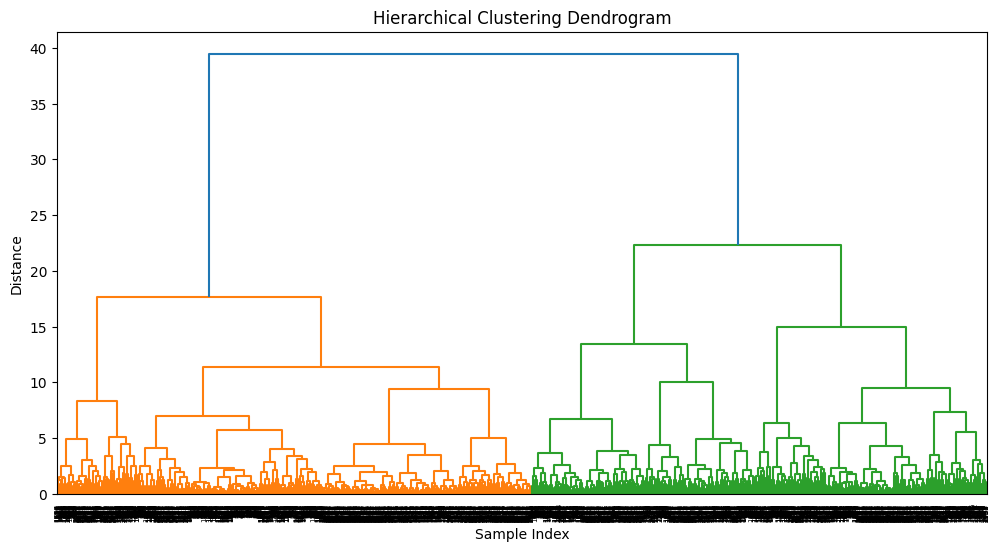

In [ ]:

Z = linkage(scaled_data, method='ward',metric='euclidean')

plt.figure(figsize=(12, 6))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()


In [ ]:
cluster = AgglomerativeClustering(n_clusters=2,metric='euclidean',linkage='ward')
labels=cluster.fit_predict(scaled_data)

In [ ]:
print(labels)

[0 1 0 0 0 0 1 0 0 1 0 1 0 0 1 1 0 1 1 1 0 1 1 1 0 1 0 0 0 0 0 1 1 1 1 1 0
 1 0 1 0 1 1 1 0 0 0 0 0 0 0 1 1 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 1 0 0 0 1
 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 0 0 1 1 0 0 0 1 1 1 1 0 1 1 1 0 1 0 1 1 0 1
 1 0 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1 1 1 1 0 1 0 1 0 1 0 0 0 1 1 1 0 1 1 1 1
 1 1 0 0 1 1 0 1 0 0 0 0 0 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 0 1 0 1 0 1 0
 0 0 1 0 1 1 0 1 1 0 1 1 0 1 0 1 0 1 0 0 0 1 0 0 0 1 1 1 1 1 0 1 0 0 1 1 0
 1 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 1 0 0 1 0 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 1
 1 1 0 1 1 0 0 0 1 0 1 0 0 0 1 0 1 1 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1
 0 0 1 0 0 0 1 1 0 1 0 0 1 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 1 0 1 0 1 0 0
 0 1 1 1 0 0 1 1 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 0 1 1 0 1 0 1 0 1
 0 1 1 1 1 0 1 1 1 0 1 0 1 0 1 1 1 0 0 0 1 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 1 0 1 1 1 1 1 0 0 1 0 0 0 0 1 0 1 1 0 0 0 1 0 0 0 1 1 0 1 1 0
 1 0 0 0 1 1 1 0 0 0 1 1 1 1 0 0 0 1 1 0 0 0 1 1 0 0 0 0 1 0 1 0 1 1 0 1 0
 0 1 1 1 1 0 0 0 1 0 1 1 

# **Evaluation**


In [ ]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Evaluate K-medoids
silhouette = silhouette_score(scaled_data, labels)
davies_bouldin = davies_bouldin_score(scaled_data, labels)
calinski_harabasz = calinski_harabasz_score(scaled_data, labels)

print("K-medoids:")
print("Silhouette Score:", silhouette)
print("Davies-Bouldin Index:", davies_bouldin)
print("Calinski-Harabasz Index:", calinski_harabasz)


K-medoids:
Silhouette Score: 0.32297533940101164
Davies-Bouldin Index: 1.3243641946424665
Calinski-Harabasz Index: 1568.9592250868711


In [ ]:
# Evaluate Hierarchical Clustering
hierarchical_labels = cluster.labels_

silhouette_hierarchical = silhouette_score(scaled_data, hierarchical_labels)
davies_bouldin_hierarchical = davies_bouldin_score(scaled_data, hierarchical_labels)
calinski_harabasz_hierarchical = calinski_harabasz_score(scaled_data, hierarchical_labels)

print("Hierarchical Clustering:")
print("Silhouette Score:", silhouette_hierarchical)
print("Davies-Bouldin Index:", davies_bouldin_hierarchical)
print("Calinski-Harabasz Index:", calinski_harabasz_hierarchical)


Hierarchical Clustering:
Silhouette Score: 0.27627621841002925
Davies-Bouldin Index: 1.4285021170311918
Calinski-Harabasz Index: 1320.4645654005237


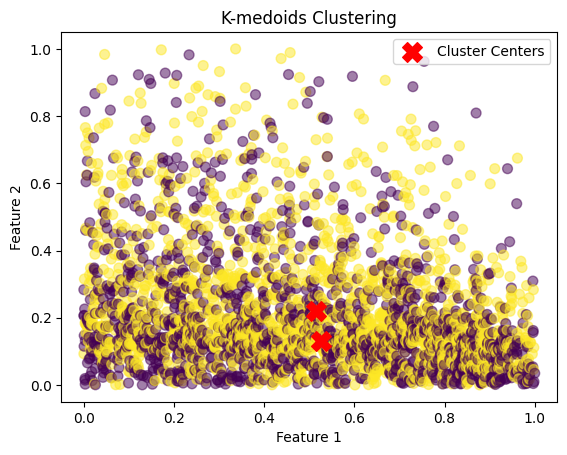

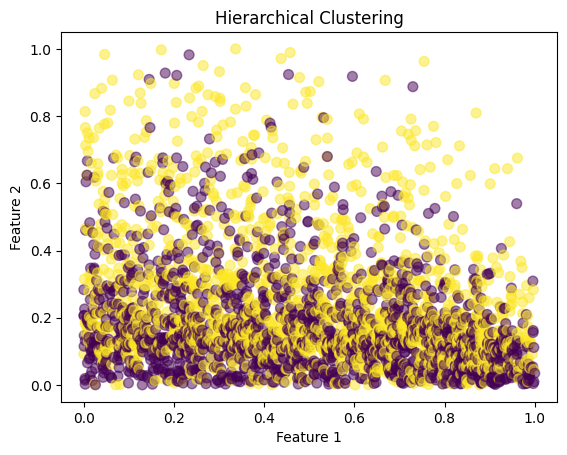

In [ ]:
# Visualize K-medoids clusters
plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', s=50, alpha=0.5)
plt.scatter(clusters[:, 0], clusters[:, 1], c='red', s=200, marker='X', label='Cluster Centers')
plt.title('K-medoids Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

# Visualize Hierarchical Clustering
plt.scatter(scaled_data.iloc[:, 0], scaled_data.iloc[:, 1], c=hierarchical_labels, cmap='viridis', s=50, alpha=0.5)
plt.title('Hierarchical Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

